In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import altair as alt

alt.data_transformers.disable_max_rows()
pd.set_option('display.max_columns', None)

# Load data

In [4]:
url_listings_paris = 'https://data.insideairbnb.com/france/ile-de-france/paris/2024-03-16/visualisations/listings.csv'

url_listings_bordeaux = 'https://data.insideairbnb.com/france/nouvelle-aquitaine/bordeaux/2024-03-23/visualisations/listings.csv'
url_reviews_bordeaux = 'https://data.insideairbnb.com/france/nouvelle-aquitaine/bordeaux/2024-03-23/data/reviews.csv.gz'
url_listings_detailed_bordeaux = 'https://data.insideairbnb.com/france/nouvelle-aquitaine/bordeaux/2024-03-23/data/listings.csv.gz'

In [5]:
df = pd.read_csv(url_listings_bordeaux)
df.head(3)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,222887,"Bordeaux Terrace - amazing view, air-con, elev...",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.836102,-0.566395,Entire home/apt,203.0,3,85,2024-01-22,0.57,4,265,21,3306300031048
1,247452,"Cosy apartment ,barbecue, pool",959918,Krista,Saint-Mdard-en-Jalles,Saint-Mdard-en-Jalles,44.858900,-0.727350,Entire home/apt,95.0,2,66,2024-03-01,0.45,1,151,11,NaN
2,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.847801,-0.581046,Entire home/apt,171.0,3,56,2024-02-21,0.48,4,229,15,33063001366CB


In [6]:
detailed_listings_bordeaux = pd.read_csv(url_listings_detailed_bordeaux)
detailed_listings_bordeaux.head(3)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,222887,https://www.airbnb.com/rooms/222887,20240323020910,2024-03-23,city scrape,"Bordeaux Terrace - amazing view, air-con, elev...",Picture yourself on a 12 metre terrace overloo...,Bordeaux Terrace is ideally situated to visit ...,https://a0.muscache.com/pictures/8f2b210e-3c0e...,1156398,https://www.airbnb.com/users/show/1156398,Suzanna,2011-09-14,"Duras, France","Originally from New Zealand and Australia, I n...",within an hour,100%,98%,t,https://a0.muscache.com/im/pictures/user/71aa6...,https://a0.muscache.com/im/pictures/user/71aa6...,Hôtel de Ville - Quinconces,21,31,"['email', 'phone', 'work_email']",t,t,"Bordeaux, Aquitaine, France",Bordeaux Sud,Bordeaux,44.836102,-0.566395,Entire vacation home,Entire home/apt,4,1.0,1 bath,2.0,3.0,"[""Hangers"", ""Conditioner"", ""Refrigerator"", ""Sh...",$203.00,3,90,3,5,90,90,4.5,90.0,NaN,t,15,29,40,265,2024-03-23,85,21,0,2012-01-04,2024-01-22,4.79,4.79,4.66,4.90,4.96,4.71,4.64,3306300031048,t,4,4,0,0,0.57
1,247452,https://www.airbnb.com/rooms/247452,20240323020910,2024-03-23,city scrape,"Cosy apartment ,barbecue, pool",NaN,NaN,https://a0.muscache.com/pictures/39503733/4b3c...,959918,https://www.airbnb.com/users/show/959918,Krista,2011-08-12,"Bordeaux, France","Hi, I'm Krista, 43 years old, Belgian and livi...",within a few hours,100%,86%,t,https://a0.muscache.com/im/users/959918/profil...,https://a0.muscache.com/im/users/959918/profil...,NaN,1,1,"['email', 'phone']",t,f,NaN,Saint-Mdard-en-Jalles,Saint-Mdard-en-Jalles,44.858900,-0.727350,Entire rental unit,Entire home/apt,4,1.0,1 bath,2.0,2.0,"[""Bathtub"", ""Hangers"", ""Bidet"", ""Free parking ...",$95.00,2,30,2,2,30,30,2.0,30.0,NaN,t,29,59,89,151,2024-03-23,66,11,1,2012-04-23,2024-03-01,4.82,4.78,4.78,4.97,4.91,4.52,4.70,NaN,f,1,1,0,0,0.45
2,317273,https://www.airbnb.com/rooms/317273,20240323020910,2024-03-23,city scrape,"Bordeaux City Gardens - large 1 bd, park adjacent","A spacious one bedroom apartment, (93 sq metre...",Bordeaux's famous Jardin Public is at the end ...,https://a0.muscache.com/pictures/miso/Hosting-...,1156398,https://www.airbnb.com/users/show/1156398,Suzanna,2011-09-14,"Duras, France","Originally from New Zealand and Australia, I n...",within an hour,100%,98%,t,https://a0.muscache.com/im/pictures/user/71aa6...,https://a0.muscache.com/im/pictures/user/71aa6...,Hôtel de Ville - Quinconces,21,31,"['email', 'phone', 'work_email']",t,t,"Bordeaux, Nouvelle-Aquitaine, France",Chartrons - Grand Parc - Jardin Public,Bordeaux,44.847801,-0.581046,Entire rental unit,Entire home/apt,2,1.5,1.5 baths,1.0,2.0,"[""Hangers"", ""Refrigerator"", ""Shampoo"", ""High c...",$171.00,3,90,3,3,90,90,3.0,90.0,NaN,t,7,12,26,229,2024-03-2

# Bar graphs

In [20]:
alt.Chart(df).mark_bar().encode(
    alt.X("availability_365:Q", bin=alt.Bin(step=1), scale=alt.Scale(domain=(0, 365))),
    y='count()',
).properties(
    width=800
)

alt.Chart(...)

In [8]:
df_filtered = df[df["price"] < 1000]

alt.Chart(df_filtered).mark_bar().encode(
    alt.X("price:Q", bin=alt.Bin(step=20), scale=alt.Scale(domain=(0, 1000))),
    y='count()',
)

alt.Chart(...)

# Pie

In [9]:
# Convert 't'/'f' to Boolean values
detailed_listings_bordeaux['host_has_profile_pic'] = detailed_listings_bordeaux['host_has_profile_pic'].map({'t': True, 'f': False})

# Calculate the counts of True and False
counts = detailed_listings_bordeaux['host_has_profile_pic'].value_counts().reset_index()
counts.columns = ['value', 'count']

# Create the pie chart
pie_chart = alt.Chart(counts).mark_arc().encode(
    theta=alt.Theta(field="count", type="quantitative"),
    color=alt.Color(field="value", type="nominal", scale=alt.Scale(scheme='category10')),
    tooltip=[alt.Tooltip('value', title='Has Profile Pic'), alt.Tooltip('count', title='Count')]
).properties(
    title='Host Has Profile Pic'
)

# Display the pie chart
pie_chart

alt.Chart(...)

# Word analysis 

In [10]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string
from wordcloud import WordCloud

In [11]:
def tokenize(text):
    # Get stop words for both English and French
    stop_words_en = set(stopwords.words('english'))
    stop_words_fr = set(stopwords.words('french'))
    punctuation = set(string.punctuation)

    # Combine English and French stop words
    stop_words = stop_words_en.union(stop_words_fr)
    word_tokens = word_tokenize(text)

    # Filter out stop words and punctuation
    filtered_text = [w for w in word_tokens if w.lower() not in stop_words and w not in punctuation]

    return filtered_text

In [12]:
# Tokenize the text
filtered_names = tokenize(' '.join(df["name"].dropna()))
filtered_host_names = tokenize(' '.join(df["host_name"].dropna()))

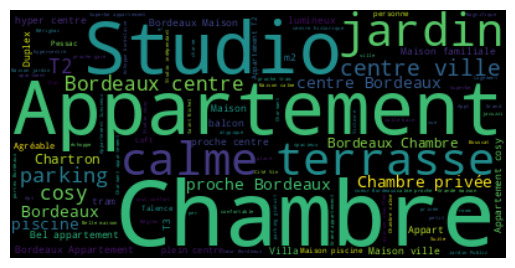

In [13]:
# Generate word cloud
wordcloud = WordCloud().generate(' '.join(filtered_names))

# Display the word cloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

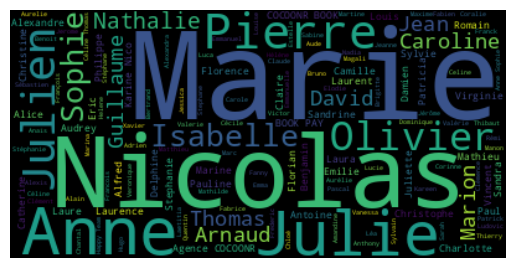

In [14]:
# Generate word cloud
wordcloud = WordCloud().generate(' '.join(filtered_host_names))

# Display the word cloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

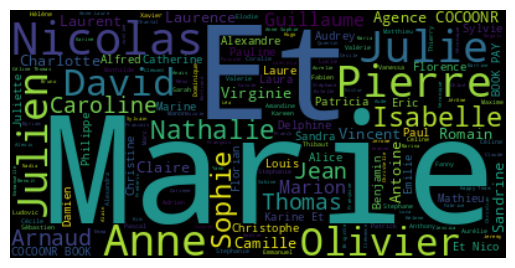

In [15]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word cloud
wordcloud = WordCloud().generate(' '.join(df["host_name"].dropna()))

# Display the word cloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Map

In [28]:
import folium

# Create a map centered on Bordeaux
map_bordeaux = folium.Map(location=[44.837789, -0.579180], zoom_start=12)

# Iterate over the rows of the DataFrame containing the points
for index, row in df.iterrows():
    # Get the latitude and longitude of the point
    lat = row['latitude']
    lon = row['longitude']
    
    # Get the price of the point
    price = row['price']
    
    # Define the color of the marker based on the price
    if price < 200:
        color = 'green'
    elif price < 500:
        color = 'yellow'
    elif price < 1000:
        color = 'orange'
    elif price >= 1000:
        color = 'red'
    else:
        color = 'black'
    
    # Create a marker and add it to the map
    folium.CircleMarker(location=[lat, lon], radius=5, color=color, fill=True, fill_color=color).add_to(map_bordeaux)

# Display the map
map_bordeaux

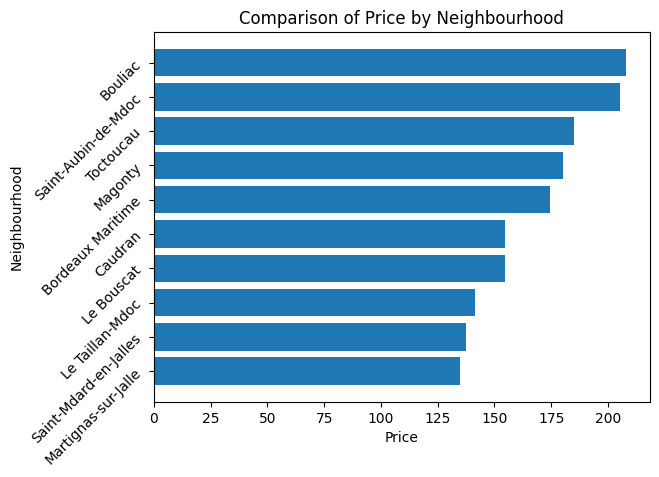

In [17]:
# Sort the DataFrame by 'price' column in descending order
mean_prices = df.groupby('neighbourhood')['price'].mean().reset_index()
mean_prices = mean_prices.sort_values(by='price', ascending=True).tail(10)

# Create the horizontal bar plot
plt.barh(mean_prices['neighbourhood'], mean_prices['price'])

# Set the labels and title
plt.xlabel('Price')
plt.ylabel('Neighbourhood')
plt.yticks(rotation=45, ha='right')
plt.title('Comparison of Price by Neighbourhood')

# Display the plot
plt.show()

In [18]:
#%load_ext rpy2.ipython